# **EDA: Gunshot-audio-dataset (Kaggle)**

**Fuente:** https://www.kaggle.com/datasets/huseyngorbani1/gunshot-audio-dataset?select=gunshot-audio-dataset

Este es un dataset de clips de audio de disparos recopilados de vídeos de YouTube, con **9 clases** correspondientes a modelos de armas específicos: IMI Desert Eagle, M4, MP5, MG-42, M16, M249, AK-12, Zastava M92 y AK-47. Lo usamos para reforzar la clase `gunshot`, que es crítica para el sistema de alertas. En este dataset hay un total de **851 archivos**. Los archivos mezclan frecuencias de muestreo de **44100 Hz y 48000 Hz**, y todos son stereo.


## **1. Importaciones y configuración**

In [1]:
# Instalar la librería de Kaggle
%pip install kaggle

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import os
import glob
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.cm as cm
import seaborn as sns
import librosa
import librosa.display
import soundfile as sf
import zipfile
import os

from pathlib import Path
from tqdm import tqdm
from scipy import stats

warnings.filterwarnings('ignore')

print('Librerías cargadas correctamente')
print(f'librosa version: {librosa.__version__}')

Librerías cargadas correctamente
librosa version: 0.11.0


## **2. Carga del dataset**

In [ ]:
!mkdir -p ~/.kaggle
!echo KGAT_da0ae50eef31161077c51016c73b8839 > ~/.kaggle/access_token
!chmod 600 ~/.kaggle/access_token
print("Configuración de Kaggle API completada.")

Configuración de Kaggle API completada.


In [4]:
# Descargar el dataset de Kaggle
DATASET_SLUG = 'huseyngorbani1/gunshot-audio-dataset'
DOWNLOAD_PATH = './gunshot-audio-dataset'

!kaggle datasets download -d {DATASET_SLUG} -p {DOWNLOAD_PATH}

print(f"Dataset descargado a: {DOWNLOAD_PATH}")

Dataset URL: https://www.kaggle.com/datasets/huseyngorbani1/gunshot-audio-dataset
License(s): unknown
100% 380M/380M [00:06<00:00, 65.2MB/s]

Dataset descargado a: ./gunshot-audio-dataset


In [5]:
# Descomprimir el dataset
zip_file_path = os.path.join(DOWNLOAD_PATH, 'gunshot-audio-dataset.zip')
extract_to_path = DOWNLOAD_PATH # Extraer en el mismo directorio

print(f"Descomprimiendo {zip_file_path}...")
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
print(f"Dataset descomprimido en: {extract_to_path}")

# Eliminar el archivo zip para ahorrar espacio
os.remove(zip_file_path)
print("Archivo zip eliminado.")

Descomprimiendo ./gunshot-audio-dataset/gunshot-audio-dataset.zip...
Dataset descomprimido en: ./gunshot-audio-dataset
Archivo zip eliminado.


In [6]:
DATASET_PATH = Path('./gunshot-audio-dataset/gunshot-audio-dataset') # Apunta al directorio donde se descomprimió el zip

# Recopilación de archivos
records = []
for filepath in DATASET_PATH.rglob('*.wav'):
    label = filepath.parent.name
    records.append({'path': str(filepath), 'label': label, 'filename': filepath.name})

for filepath in DATASET_PATH.rglob('*.mp3'):
    label = filepath.parent.name
    records.append({'path': str(filepath), 'label': label, 'filename': filepath.name})

df = pd.DataFrame(records)
print(f'Total de archivos encontrados: {len(df)}')
print(f'Clases detectadas: {df["label"].unique().tolist()}')

Total de archivos encontrados: 851
Clases detectadas: ['Zastava M92', 'MG-42', 'M249', 'AK-47', 'M4', 'MP5', 'AK-12', 'IMI Desert Eagle', 'M16']


In [7]:
print(f"Shape: {df.shape}")

Shape: (851, 3)


In [8]:
df.head(10)

,path,label,filename
0,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (71).wav
1,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (62).wav
2,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (9).wav
3,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (4).wav
4,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (53).wav
5,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (20).wav
6,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (66).wav
7,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (11).wav
8,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (5).wav
9,gunshot-audio-dataset/gunshot-audio-dataset/Za...,Zastava M92,9 (29).wav


In [9]:
df.tail(10)

,path,label,filename
841,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (97).wav
842,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (32).wav
843,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (65).wav
844,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (48).wav
845,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (55).wav
846,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (80).wav
847,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (52).wav
848,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (72).wav
849,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (71).wav
850,gunshot-audio-dataset/gunshot-audio-dataset/M1...,M16,5 (18).wav


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 851 entries, 0 to 850
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      851 non-null    object
 1   label     851 non-null    object
 2   filename  851 non-null    object
dtypes: object(3)
memory usage: 20.1+ KB


## **3. Estructura y tipos de datos**

In [11]:
# Estilo de las gráficas
plt.rcParams.update({
    'figure.dpi': 120,
    'axes.titlesize': 13,
    'axes.labelsize': 11,
    'font.family': 'sans-serif',
})

clases = df['label'].unique()
colors = cm.tab10.colors[:len(clases)]
PALETTE = dict(zip(clases, colors))

In [12]:
df.columns

Index(['path', 'label', 'filename'], dtype='object')

In [13]:
print("Valores nulos")
df.isnull().sum()

Valores nulos


,0
path,0
label,0
filename,0


In [14]:
print("Valores faltantes del dataframe")
df.isna().sum().sum()

Valores faltantes del dataframe


np.int64(0)

In [15]:
print("Valores faltantes para cada columna")
df.isna().sum()

Valores faltantes para cada columna


,0
path,0
label,0
filename,0


In [16]:
(df.isna().sum() / len(df) * 100).sort_values(ascending=False)

,0
path,0.0
label,0.0
filename,0.0


In [17]:
print("Tipos de datos")
df.dtypes

Tipos de datos


,0
path,object
label,object
filename,object


In [18]:
print("Posibles variables categóricas")
df.select_dtypes(include=['object']).columns

Posibles variables categóricas


Index(['path', 'label', 'filename'], dtype='object')

## **4. Distribución de clases**


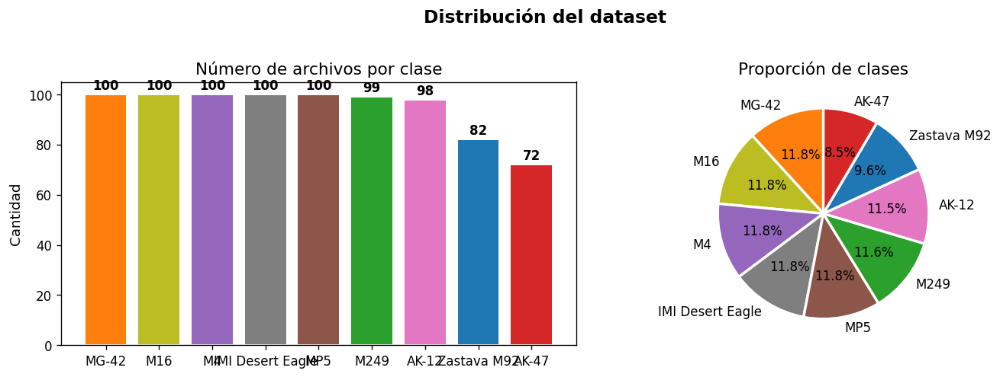


                   count    pct
label                         
MG-42               100  11.75
M16                 100  11.75
M4                  100  11.75
IMI Desert Eagle    100  11.75
MP5                 100  11.75
M249                 99  11.63
AK-12                98  11.52
Zastava M92          82   9.64
AK-47                72   8.46


In [19]:
counts = df['label'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Bar chart
colors = [PALETTE.get(lbl, 'steelblue') for lbl in counts.index]
axes[0].bar(counts.index, counts.values, color=colors, edgecolor='white', linewidth=1.2)
axes[0].set_title('Número de archivos por clase')
axes[0].set_ylabel('Cantidad')
for i, (lbl, val) in enumerate(counts.items()):
    axes[0].text(i, val + 2, str(val), ha='center', fontweight='bold')

# Pie chart
axes[1].pie(counts.values, labels=counts.index, colors=colors,
            autopct='%1.1f%%', startangle=90,
            wedgeprops={'edgecolor': 'white', 'linewidth': 2})
axes[1].set_title('Proporción de clases')

plt.suptitle('Distribución del dataset', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print('\n', counts.to_frame('count').assign(pct=lambda x: (x['count']/x['count'].sum()*100).round(2)))

## **5. Propiedades de los archivos de audio**

In [20]:
def get_audio_properties(path):
    """Devuelve las propiedades básicas de un archivo de audio."""
    try:
        info = sf.info(path)
        return {
            'duration_s': info.duration,
            'sample_rate': info.samplerate,
            'channels': info.channels,
            'frames': info.frames,
            'format': info.format
        }
    except Exception:
        return {'duration_s': np.nan, 'sample_rate': np.nan,
                'channels': np.nan, 'frames': np.nan, 'format': 'error'}

props = [get_audio_properties(p) for p in tqdm(df['path'], desc='Leyendo propiedades')]
df = pd.concat([df, pd.DataFrame(props)], axis=1)

print('\nEstadísticas generales:')
display(df[['duration_s', 'sample_rate', 'channels']].describe().round(3))

Leyendo propiedades: 100%|██████████| 851/851 [00:00<00:00, 9085.44it/s]


Estadísticas generales:


,duration_s,sample_rate,channels
count,851.000,851.000,851.0
mean,3.038,47097.180,2.0
std,19.412,1645.934,0.0
min,1.000,44100.000,2.0
25%,2.000,48000.000,2.0
50%,2.000,48000.000,2.0
75%,2.000,48000.000,2.0
max,360.000,48000.000,2.0


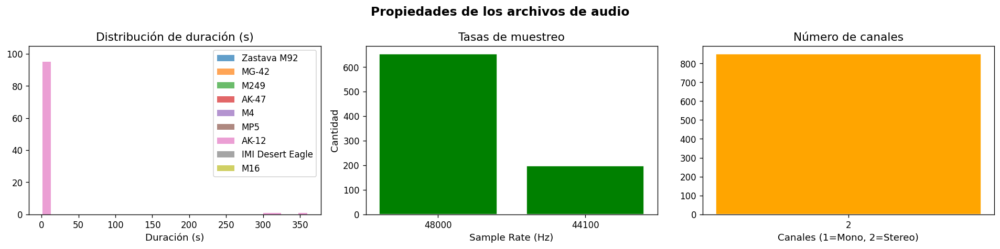


Duración por clase:


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
AK-12,98.0,11.704,56.705,1.0,1.0,2.0,2.0,360.0
AK-47,72.0,2.056,0.285,2.0,2.0,2.0,2.0,4.0
IMI Desert Eagle,100.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
M16,100.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
M249,99.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
M4,100.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
MG-42,100.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
MP5,100.0,2.000,0.000,2.0,2.0,2.0,2.0,2.0
Zastava M92,82.0,1.122,0.329,1.0,1.0,1.0,1.0,2.0


In [21]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Duración por clase
for lbl in df['label'].unique():
    subset = df[df['label'] == lbl]['duration_s']
    axes[0].hist(subset, bins=30, alpha=0.7, label=lbl, color=PALETTE.get(lbl, 'steelblue'))
axes[0].set_title('Distribución de duración (s)')
axes[0].set_xlabel('Duración (s)')
axes[0].legend()

# Sample rate
sr_counts = df['sample_rate'].value_counts()
axes[1].bar(sr_counts.index.astype(str), sr_counts.values, color='green', edgecolor='white')
axes[1].set_title('Tasas de muestreo')
axes[1].set_xlabel('Sample Rate (Hz)')
axes[1].set_ylabel('Cantidad')

# Canales
ch_counts = df['channels'].value_counts()
axes[2].bar(ch_counts.index.astype(str), ch_counts.values, color='orange', edgecolor='white')
axes[2].set_title('Número de canales')
axes[2].set_xlabel('Canales (1=Mono, 2=Stereo)')

plt.suptitle('Propiedades de los archivos de audio', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nDuración por clase:')
display(df.groupby('label')['duration_s'].describe().round(3))

## **6. Análisis de formas de onda (waveform)**

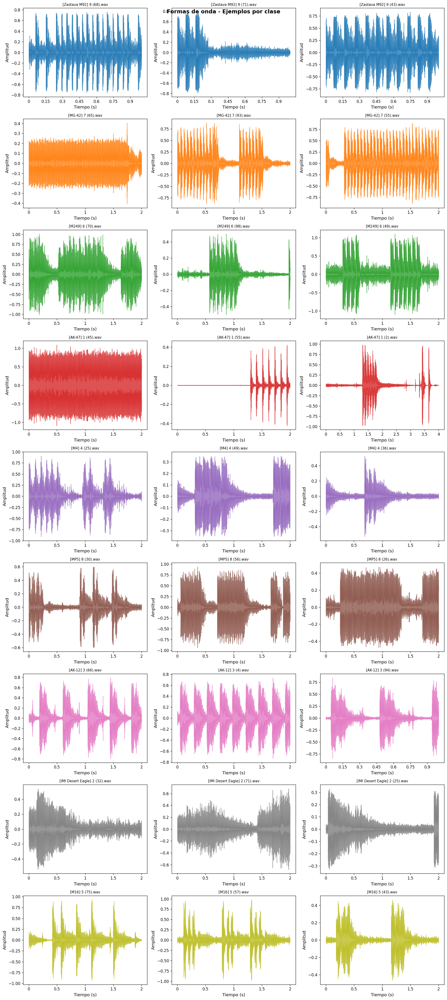

In [22]:
SAMPLE_SR = 22050 # sample rate de trabajo
N_SAMPLES  = 3 # archivos de ejemplo por clase

labels = df['label'].unique()
fig, axes = plt.subplots(len(labels), N_SAMPLES, figsize=(16, 4 * len(labels)))
if len(labels) == 1:
    axes = [axes] # asegura iterable

for row_i, lbl in enumerate(labels):
    samples = df[df['label'] == lbl].sample(min(N_SAMPLES, len(df[df['label']==lbl])), random_state=42)
    for col_i, (_, row) in enumerate(samples.iterrows()):
        y, sr = librosa.load(row['path'], sr=SAMPLE_SR, mono=True)
        ax = axes[row_i][col_i]
        librosa.display.waveshow(y, sr=sr, ax=ax, color=PALETTE.get(lbl, 'steelblue'), alpha=0.8)
        ax.set_title(f'[{lbl}] {row["filename"][:25]}', fontsize=9)
        ax.set_xlabel('Tiempo (s)')
        ax.set_ylabel('Amplitud')

plt.suptitle('Formas de onda - Ejemplos por clase', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **7. Espectrogramas (STFT)**

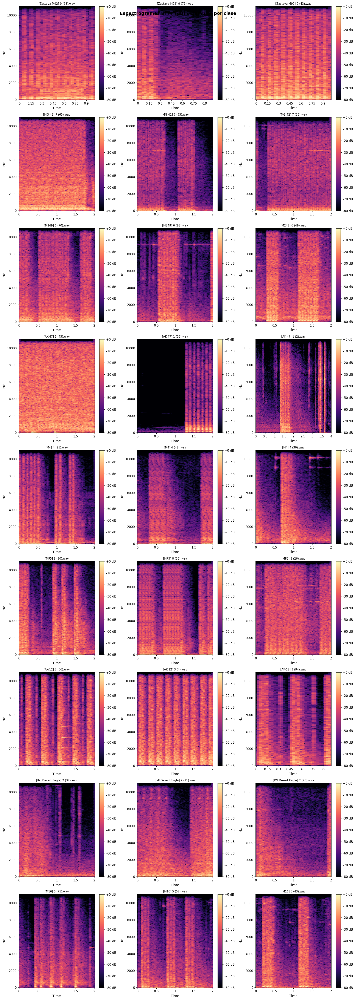

In [23]:
fig, axes = plt.subplots(len(labels), N_SAMPLES, figsize=(16, 5 * len(labels)))
if len(labels) == 1:
    axes = [axes]

for row_i, lbl in enumerate(labels):
    samples = df[df['label'] == lbl].sample(min(N_SAMPLES, len(df[df['label']==lbl])), random_state=42)
    for col_i, (_, row) in enumerate(samples.iterrows()):
        y, sr = librosa.load(row['path'], sr=SAMPLE_SR, mono=True)
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
        ax = axes[row_i][col_i]
        img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=ax, cmap='magma')
        ax.set_title(f'[{lbl}] {row["filename"][:25]}', fontsize=9)
        fig.colorbar(img, ax=ax, format='%+2.0f dB')

plt.suptitle('Espectrogramas STFT (dB) - Ejemplos por clase', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **8. Espectrogramas Mel**

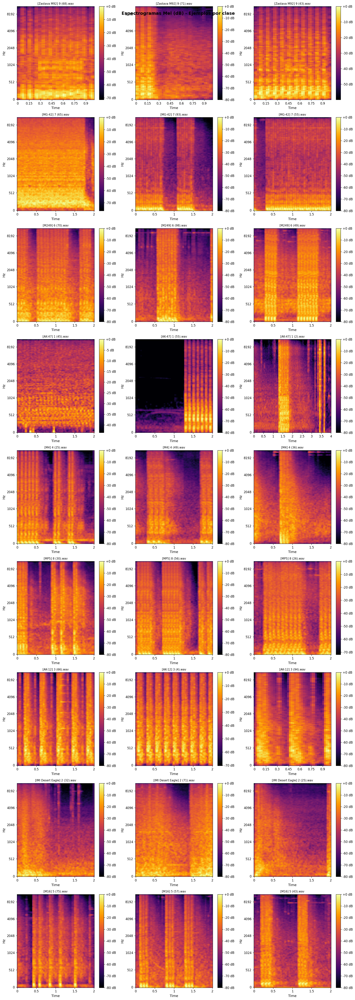

In [24]:
N_MELS = 128

fig, axes = plt.subplots(len(labels), N_SAMPLES, figsize=(16, 5 * len(labels)))
if len(labels) == 1:
    axes = [axes]

for row_i, lbl in enumerate(labels):
    samples = df[df['label'] == lbl].sample(min(N_SAMPLES, len(df[df['label']==lbl])), random_state=42)
    for col_i, (_, row) in enumerate(samples.iterrows()):
        y, sr = librosa.load(row['path'], sr=SAMPLE_SR, mono=True)
        S_mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=N_MELS)
        S_mel_db = librosa.power_to_db(S_mel, ref=np.max)
        ax = axes[row_i][col_i]
        img = librosa.display.specshow(S_mel_db, sr=sr, x_axis='time', y_axis='mel', ax=ax, cmap='inferno')
        ax.set_title(f'[{lbl}] {row["filename"][:25]}', fontsize=9)
        fig.colorbar(img, ax=ax, format='%+2.0f dB')

plt.suptitle('Espectrogramas Mel (dB) - Ejemplos por clase', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **9. MFCCs (Mel-Frequency Cepstral Coefficients)**

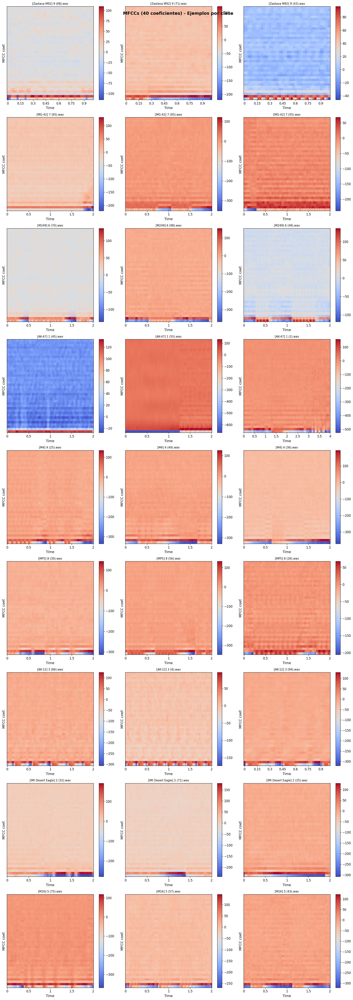

In [25]:
N_MFCC = 40

fig, axes = plt.subplots(len(labels), N_SAMPLES, figsize=(16, 5 * len(labels)))
if len(labels) == 1:
    axes = [axes]

for row_i, lbl in enumerate(labels):
    samples = df[df['label'] == lbl].sample(min(N_SAMPLES, len(df[df['label']==lbl])), random_state=42)
    for col_i, (_, row) in enumerate(samples.iterrows()):
        y, sr = librosa.load(row['path'], sr=SAMPLE_SR, mono=True)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=N_MFCC)
        ax = axes[row_i][col_i]
        img = librosa.display.specshow(mfcc, sr=sr, x_axis='time', ax=ax, cmap='coolwarm')
        ax.set_title(f'[{lbl}] {row["filename"][:25]}', fontsize=9)
        ax.set_ylabel('MFCC coef.')
        fig.colorbar(img, ax=ax)

plt.suptitle(f'MFCCs ({N_MFCC} coeficientes) - Ejemplos por clase', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **10. Análisis estadístico de features acústicas**
Extraemos un conjunto de features numéricas por archivo para comparar clases.

In [26]:
def extract_features(path, sr=SAMPLE_SR):
    """Extrae features acústicas de un archivo de audio."""
    try:
        y, sr = librosa.load(path, sr=sr, mono=True)
        feats = {}

        # RMS Energy
        rms = librosa.feature.rms(y=y)[0]
        feats['rms_mean'] = rms.mean()
        feats['rms_std'] = rms.std()

        # Zero Crossing Rate
        zcr = librosa.feature.zero_crossing_rate(y)[0]
        feats['zcr_mean'] = zcr.mean()
        feats['zcr_std'] = zcr.std()

        # Spectral Centroid
        centroid = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
        feats['spectral_centroid_mean'] = centroid.mean()
        feats['spectral_centroid_std'] = centroid.std()

        # Spectral Bandwidth
        bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
        feats['spectral_bandwidth_mean'] = bandwidth.mean()

        # Spectral Rolloff
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
        feats['spectral_rolloff_mean'] = rolloff.mean()

        # Spectral Flatness
        flatness = librosa.feature.spectral_flatness(y=y)[0]
        feats['spectral_flatness_mean'] = flatness.mean()

        # MFCCs (medias de los primeros 10 coeficientes)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=10)
        for i, coef in enumerate(mfcc):
            feats[f'mfcc_{i+1}_mean'] = coef.mean()
            feats[f'mfcc_{i+1}_std'] = coef.std()

        # Chroma STFT
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        feats['chroma_mean'] = chroma.mean()
        feats['chroma_std'] = chroma.std()

        # Tonnetz
        tonnetz = librosa.feature.tonnetz(y=librosa.effects.harmonic(y), sr=sr)
        feats['tonnetz_mean'] = tonnetz.mean()

        return feats
    except Exception as e:
        return {}

print('Extrayendo features acústicas (puede tardar unos minutos)...')
feat_list = [extract_features(p) for p in tqdm(df['path'], desc='Features')]
feat_df = pd.DataFrame(feat_list)
df_full = pd.concat([df.reset_index(drop=True), feat_df], axis=1)

print(f'\nFeatures extraídas: {feat_df.shape[1]}')
feat_df.describe().round(4)

Extrayendo features acústicas (puede tardar unos minutos)...


Features: 100%|██████████| 851/851 [06:28<00:00,  2.19it/s]


Features extraídas: 32


,rms_mean,rms_std,zcr_mean,zcr_std,spectral_centroid_mean,spectral_centroid_std,spectral_bandwidth_mean,spectral_rolloff_mean,spectral_flatness_mean,mfcc_1_mean,...,mfcc_7_std,mfcc_8_mean,mfcc_8_std,mfcc_9_mean,mfcc_9_std,mfcc_10_mean,mfcc_10_std,chroma_mean,chroma_std,tonnetz_mean
count,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,...,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000,851.0000
mean,0.1355,0.0709,0.1438,0.0433,2710.2964,582.2195,2583.7130,5681.0083,0.0677,-96.4481,...,6.3462,3.8423,5.6733,-4.1960,5.3597,2.0708,5.0371,0.6638,0.2046,-0.0003
std,0.0874,0.0412,0.0585,0.0307,558.7447,262.8798,309.1371,1074.0074,0.0445,92.3355,...,2.1617,5.7065,1.8217,5.8983,1.6546,5.2947,1.4752,0.0471,0.0280,0.0142
min,0.0135,0.0055,0.0428,0.0082,1182.5294,75.9773,1356.8095,2272.0004,0.0038,-493.2284,...,1.9719,-22.4011,1.7250,-20.2483,1.2622,-15.4337,1.5634,0.4658,0.1280,-0.0894
25%,0.0708,0.0392,0.1066,0.0249,2340.8899,402.4398,2401.3756,4914.0255,0.0372,-160.0128,...,4.7865,0.1025,4.3525,-7.6675,4.1209,-0.8463,3.9741,0.6347,0.1869,-0.0057
50%,0.1098,0.0642,0.1350,0.0360,2632.0931,576.2973,2592.9684,5684.5181,0.0569,-98.2326,...,6.0828,4.4169,5.2989,-3.2385,5.1434,2.8450,4.8024,0.6655,0.2020,0.0005
75%,0.1697,0.0903,0.1617,0.0526,2993.4892,731.7093,2774.0641,6324.6359,0.0872,-34.6671,...,7.5506,7.9078,6.7228,-0.4270,6.2793,5.9152,5.8682,0.6941,0.2182,0.0065
max,0.4597,0.2067,0.4101,0.3080,4748.4766,2548.9327,3424.0100,8647.6849,0.3051,129.9223,...,23.2057,20.4173,17.4424,12.5146,12.8272,13.5576,11.4783,0.8023,0.3410,0.0592


In [27]:
# Outliers de duración
print("Archivos con duración > 10s:")
print(df[df['duration_s'] > 10][['filename', 'label', 'duration_s']].to_string())

print(f"\nTotal outliers (> 10s): {len(df[df['duration_s'] > 10])}")
print(f"Porcentaje del dataset: {len(df[df['duration_s'] > 10])/len(df)*100:.2f}%")

Archivos con duración > 10s:
       filename  label  duration_s
578  3 (72).wav  AK-12       320.0
629  3 (57).wav  AK-12       360.0
650  3 (89).wav  AK-12       305.0

Total outliers (> 10s): 3
Porcentaje del dataset: 0.35%


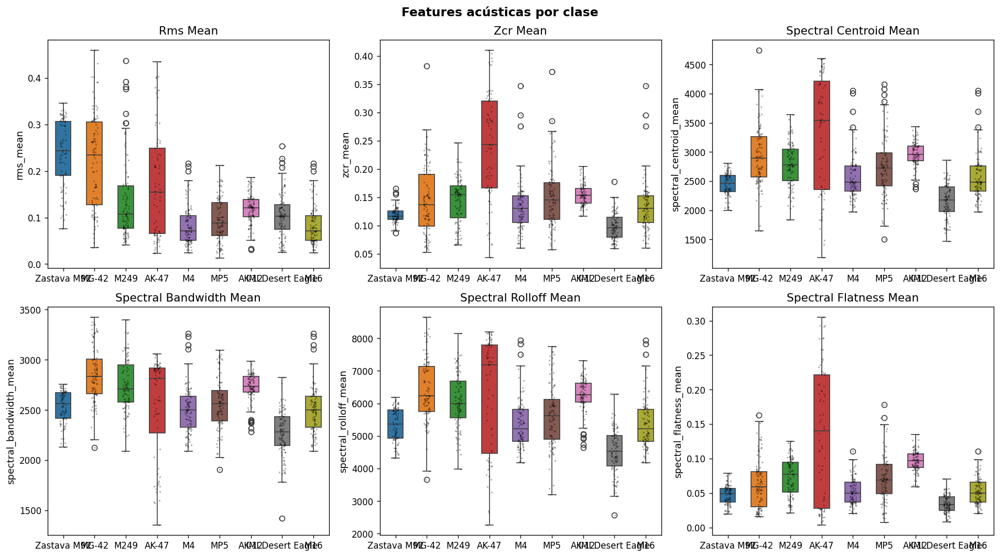

In [28]:
# Boxplots de features clave por clase
key_features = [
    'rms_mean', 'zcr_mean', 'spectral_centroid_mean',
    'spectral_bandwidth_mean', 'spectral_rolloff_mean', 'spectral_flatness_mean'
]

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes = axes.flatten()

for i, feat in enumerate(key_features):
    if feat not in df_full.columns:
        continue
    data_plot = df_full[['label', feat]].dropna()
    order = data_plot['label'].unique()
    colors_list = [PALETTE.get(lbl, 'steelblue') for lbl in order]
    sns.boxplot(data=data_plot, x='label', y=feat, ax=axes[i],
                palette={lbl: PALETTE.get(lbl, 'steelblue') for lbl in order},
                order=order, width=0.5)
    sns.stripplot(data=data_plot, x='label', y=feat, ax=axes[i],
                  color='black', alpha=0.3, size=2, jitter=True, order=order)
    axes[i].set_title(feat.replace('_', ' ').title())
    axes[i].set_xlabel('')

plt.suptitle('Features acústicas por clase', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

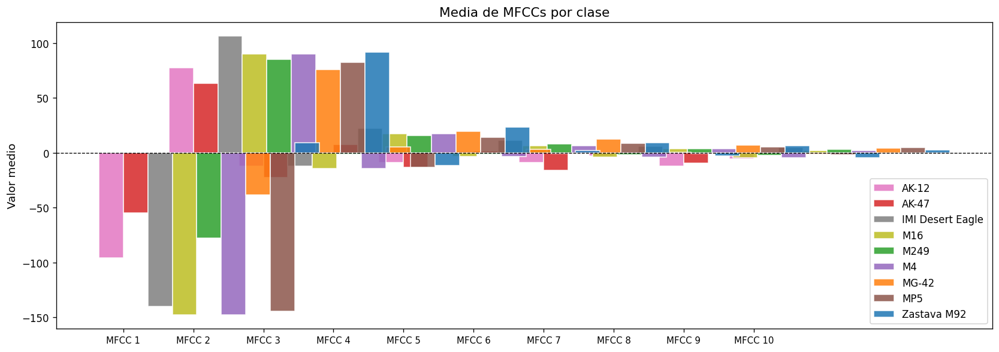

In [29]:
# MFCCs medias por clase
mfcc_cols = [c for c in df_full.columns if c.startswith('mfcc_') and c.endswith('_mean')]
mfcc_by_class = df_full.groupby('label')[mfcc_cols].mean()

fig, ax = plt.subplots(figsize=(14, 5))
x = np.arange(len(mfcc_cols))
width = 0.35

for i, (lbl, row) in enumerate(mfcc_by_class.iterrows()):
    ax.bar(x + i * width, row.values, width, label=lbl,
           color=PALETTE.get(lbl, 'steelblue'), alpha=0.85, edgecolor='white')

ax.set_xticks(x + width / 2)
ax.set_xticklabels([c.replace('mfcc_', 'MFCC ').replace('_mean', '') for c in mfcc_cols], fontsize=9)
ax.set_title('Media de MFCCs por clase')
ax.set_ylabel('Valor medio')
ax.legend()
ax.axhline(0, color='black', linewidth=0.8, linestyle='--')
plt.tight_layout()
plt.show()

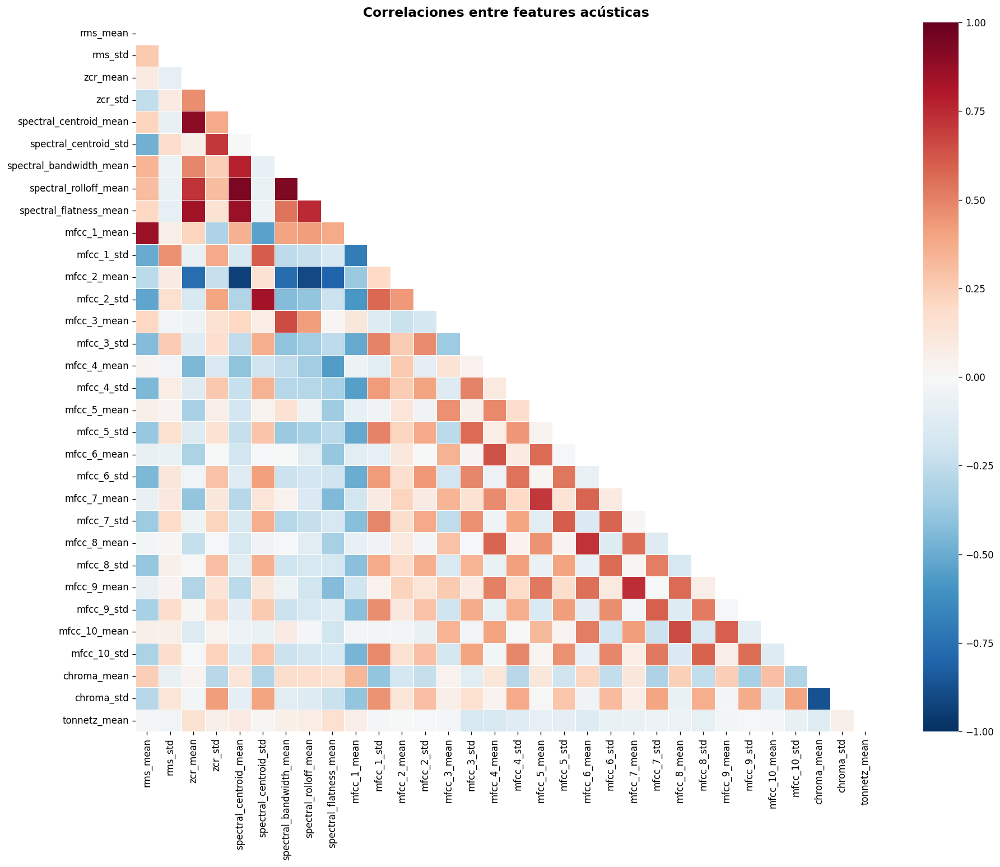

In [30]:
# Heatmap de correlaciones (features numéricas)
numeric_feats = df_full.select_dtypes(include=np.number).drop(
    columns=['sample_rate', 'channels', 'frames', 'duration_s'], errors='ignore').dropna(axis=1)

if numeric_feats.shape[1] > 1:
    corr = numeric_feats.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    fig, ax = plt.subplots(figsize=(16, 13))
    sns.heatmap(corr, mask=mask, cmap='RdBu_r', center=0,
                annot=False, linewidths=0.3, ax=ax,
                vmin=-1, vmax=1)
    ax.set_title('Correlaciones entre features acústicas', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [31]:
# Test estadístico: diferencia entre clases
label_list = df_full['label'].unique()
if len(label_list) == 2:
    lbl_a, lbl_b = label_list
    results = []
    for feat in key_features:
        if feat not in df_full.columns:
            continue
        a = df_full[df_full['label'] == lbl_a][feat].dropna()
        b = df_full[df_full['label'] == lbl_b][feat].dropna()
        stat, pval = stats.mannwhitneyu(a, b, alternative='two-sided')
        results.append({'feature': feat, 'U-stat': round(stat, 2), 'p-value': round(pval, 5),
                        'significativo (p < 0.05)': 'True' if pval < 0.05 else 'False'})

    print(f'Mann-Whitney U Test: {lbl_a} vs {lbl_b}\n')
    display(pd.DataFrame(results).set_index('feature'))
else:
    print('Test disponible solo para dos clases. Ajustar si hay más clases.')

Test disponible solo para dos clases. Ajustar si hay más clases.


## **11. Análisis de energía en el tiempo**
Comparamos el perfil temporal de energía entre un disparo y un sonido de fondo.

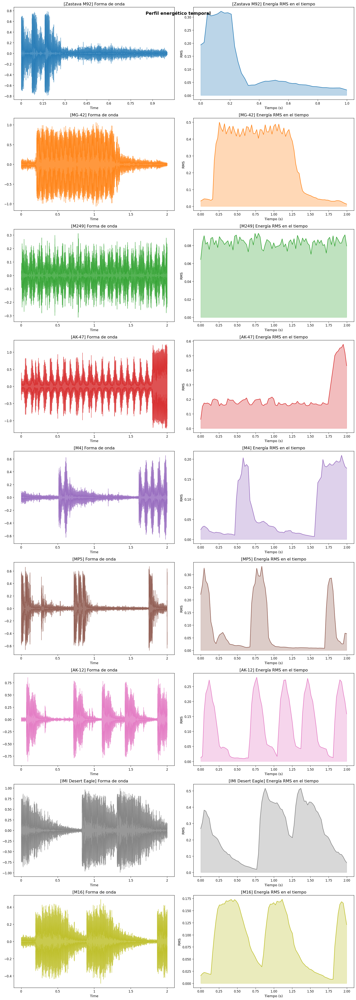

In [32]:
fig, axes = plt.subplots(len(label_list), 2, figsize=(16, 5 * len(label_list)))
if len(label_list) == 1:
    axes = [axes]

for row_i, lbl in enumerate(label_list):
    row = df[df['label'] == lbl].iloc[0]
    y, sr = librosa.load(row['path'], sr=SAMPLE_SR, mono=True)

    # Waveform
    librosa.display.waveshow(y, sr=sr, ax=axes[row_i][0],
                             color=PALETTE.get(lbl, 'steelblue'), alpha=0.8)
    axes[row_i][0].set_title(f'[{lbl}] Forma de onda')

    # RMS Energy
    rms = librosa.feature.rms(y=y, frame_length=2048, hop_length=512)[0]
    times = librosa.times_like(rms, sr=sr, hop_length=512)
    axes[row_i][1].plot(times, rms, color=PALETTE.get(lbl, 'steelblue'), linewidth=1.5)
    axes[row_i][1].fill_between(times, rms, alpha=0.3, color=PALETTE.get(lbl, 'steelblue'))
    axes[row_i][1].set_title(f'[{lbl}] Energía RMS en el tiempo')
    axes[row_i][1].set_xlabel('Tiempo (s)')
    axes[row_i][1].set_ylabel('RMS')

plt.suptitle('Perfil energético temporal', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## **12. Conclusiones**

In [33]:
print('=' * 60)
print('Resumen del EDA gunshot-audio-dataset')
print('=' * 60)

print(f'\nTotal de archivos: {len(df)}')
for lbl, cnt in df['label'].value_counts().items():
    print(f'{lbl:20s}: {cnt} archivos ({cnt/len(df)*100:.2f}%)')

print(f'\nDuración media: {df["duration_s"].mean():.2f} s')
print(f'\nDuración mínima: {df["duration_s"].min():.2f} s')
print(f'\nDuración máxima: {df["duration_s"].max():.2f} s')
print(f'\nSample rate(s): {df["sample_rate"].unique().tolist()}')
print(f'\nCanales únicos: {df["channels"].unique().tolist()}')

outliers = df[df['duration_s'] > 10]

print('\n' + '=' * 60)
print('Observaciones:')
print(f'''
  1. BALANCE DE CLASES
     El dataset está casi perfectamente balanceado: la mayoría
     de las armas tiene 100 muestras. Las excepciones
     son AK-47 (72) y Zastava M92 (82).
     No será necesario aplicar pesos de clase ni oversampling,
     aunque sí conviene tenerlo en cuenta.

  2. OUTLIERS DE DURACIÓN
     Se detectaron {len(outliers)} archivos con duración > 10s,
     incluyendo un caso extremo de 360s. Estos clips
     probablemente sean vídeos completos sin recortar.
     Deben filtrarse o segmentarse antes del entrenamiento.

  3. SAMPLE RATES MIXTOS
     El dataset mezcla archivos a 44100 Hz y 48000 Hz.
     Es imprescindible resamplear todo a una tasa única
     (recomendado: 22050 Hz) antes de extraer features.

  4. TODAS LAS CLASES SON DISPAROS
     A diferencia de otros datasets binarios, aquí todas las
     clases son variantes de disparos de armas distintas.
     Para el sistema de alertas, todas se mapearán a la
     etiqueta canónica "gunshot". El EDA confirma que los
     patrones acústicos (MFCCs, energía RMS) son similares
     entre clases, lo cual es coherente.

  5. AUDIO STEREO
     Todos los archivos son stereo (2 canales). Convertir
     a mono antes de entrenar para reducir complejidad.
''')
print('=' * 60)

Resumen del EDA gunshot-audio-dataset

Total de archivos: 851
MG-42               : 100 archivos (11.75%)
M16                 : 100 archivos (11.75%)
M4                  : 100 archivos (11.75%)
IMI Desert Eagle    : 100 archivos (11.75%)
MP5                 : 100 archivos (11.75%)
M249                : 99 archivos (11.63%)
AK-12               : 98 archivos (11.52%)
Zastava M92         : 82 archivos (9.64%)
AK-47               : 72 archivos (8.46%)

Duración media: 3.04 s

Duración mínima: 1.00 s

Duración máxima: 360.00 s

Sample rate(s): [44100, 48000]

Canales únicos: [2]

Observaciones:

  1. BALANCE DE CLASES
     El dataset está casi perfectamente balanceado: la mayoría
     de las armas tiene 100 muestras. Las excepciones
     son AK-47 (72) y Zastava M92 (82).
     No será necesario aplicar pesos de clase ni oversampling,
     aunque sí conviene tenerlo en cuenta.

  2. OUTLIERS DE DURACIÓN
     Se detectaron 3 archivos con duración > 10s,
     incluyendo un caso extremo de 360s